In [2]:
from nilearn import plotting

surfpath='/Volumes/BAHAMUT/ALL_PRF_DAT/BIGRUN/derivatives/freesurfer/fsaverage/surf'
def listabsdir(FOLDER,ext):
    
   
    def fprintf(stream, format_spec, *args):
        stream.write(format_spec % args)
    import os
    import sys
    niftilist=list()
    for file in os.listdir(FOLDER):
        if not file.startswith('.') and file.endswith(tuple(ext)):
            niftilist.append(FOLDER+"/"+file)
    fprintf(sys.stdout, "Found %d directories \n", len(niftilist))
    return(sorted(niftilist))
surface_files=listabsdir(surfpath, ['pial','orig','sphere', 'white','inflated','sulc','curv'])
surface_filesL=[surf for surf in surface_files if "lh" in(surf)]
surface_filesR=[surf for surf in surface_files if "rh" in(surf)]


flatlh='/Volumes/BAHAMUT/ALL_PRF_DAT/BIGRUN/derivatives/freesurfer/fsaverage/surf/flat_lh.gii'
flatrh='/Volumes/BAHAMUT/ALL_PRF_DAT/BIGRUN/derivatives/freesurfer/fsaverage/surf/flat_rh.gii'

Found 19 directories 


In [3]:
import dill

def load(filename):
    input_file = open(filename, 'rb')
    obj = dill.load(input_file)
    return obj

In [5]:
import nilearn
from nilearn import surface


atlaspath='/Volumes/BAHAMUT/ATLAS/lh.wang2015_atlas.mgz'
surfpath='/Volumes/BAHAMUT/PRF_DATA/ds002574-download/derivatives/freesurfer/fsaverage/surf'
atlas = surface.load_surf_data(atlaspath)

In [11]:
plotting.view_surf(flatlh,surf_map=atlas,cmap='gist_ncar',bg_map=surface_filesL[1],symmetric_cmap=False,threshold=1e-6)

In [12]:
roinames=["None", "V1v", "V1d" ,"V2v" ,"V2d" ,"V3v" ,"V3d" ,"hV4" ,"VO1" ,"VO2" ,"PHC1" ,"PHC2",
    "TO2" ,"TO1" ,"LO2", "LO1" ,"V3B","V3A","IPS0","IPS1","IPS2","IPS3","IPS4",
    "IPS5" ,"SPL1" ,"FEF"]

In [15]:
meanvolL=load('/Volumes/BAHAMUT/DUMP/BIGLHEM.pkl')
meanvolR=load('/Volumes/BAHAMUT/DUMP/BIGRHEM.pkl')

In [85]:
meanvolL.shape[-1]

163842

In [17]:
import numpy as np
number=roinames.index("V1d")
number
idx=np.squeeze(np.where(atlas == number))
signalsL=meanvolL[:,idx]
signalsR=meanvolR[:,idx]

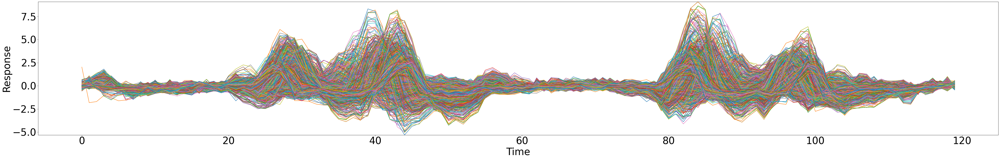

In [19]:
figsizex=70
figsizey=10

import matplotlib.pyplot as plt

def plotts(data):
    ylim=(np.min(data),np.max(data))
    plt.figure(figsize=(figsizex,figsizey))
    plt.plot(data)
    plt.rcParams.update({'font.size': 40})
    plt.ylim(ylim)
    plt.xlabel('Time')
    plt.ylabel('Response')
    plt.show()


plotts(meanvolL[:,idx])

In [31]:
from joblib import Parallel, delayed

In [33]:
vindexL=[]

vindexL=Parallel(n_jobs=5,verbose=9)(delayed(np.std)(meanvolL[:,fn])  for fn in range(163842))


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done   8 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done  24 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done  80 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done 384 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done 2304 tasks      | elapsed:    0.5s
[Parallel(n_jobs=5)]: Done 18432 tasks      | elapsed:    1.2s
[Parallel(n_jobs=5)]: Done 53248 tasks      | elapsed:    2.7s
[Parallel(n_jobs=5)]: Done 92160 tasks      | elapsed:    4.4s
[Parallel(n_jobs=5)]: Done 135168 tasks      | elapsed:    6.3s
[Parallel(n_jobs=5)]: Done 163842 out of 163842 | elapsed:    7.5s finished


In [36]:
vindexR=[]

vindexR=Parallel(n_jobs=5,verbose=9)(delayed(np.std)(meanvolR[:,fn])  for fn in range(163842))

[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 150 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 758 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 4598 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done 28662 tasks      | elapsed:    1.4s
[Parallel(n_jobs=5)]: Done 63478 tasks      | elapsed:    2.9s
[Parallel(n_jobs=5)]: Done 102390 tasks      | elapsed:    4.6s
[Parallel(n_jobs=5)]: Done 145398 tasks      | elapsed:    6.5s
[Parallel(n_jobs=5)]: Done 163842 out of 163842 | elapsed:    7.2s finished


In [37]:
Lstds=np.array(vindexL)
Rstds=np.array(vindexR)

In [38]:
Lstds

array([0.2052473 , 0.38033963, 0.19544801, ..., 0.3063003 , 0.31989312,
       0.29349283])

In [55]:
idxsL=np.squeeze(np.where(Lstds!=0))

In [56]:
idxsR=np.squeeze(np.where(Rstds!=0))

In [57]:
idxsL

array([     0,      1,      2, ..., 163839, 163840, 163841])

In [58]:
idxsL.shape

(132056,)

In [59]:
idxsR.shape

(129263,)

In [61]:
132056/100

1320.56

In [66]:
splits=np.array_split(idxsL, 100)

In [109]:
tt=np.squeeze(splits[99])
tt

array([161935, 161936, 161937, ..., 163839, 163840, 163841])

In [113]:
len(tt)

1320

In [71]:
chunkstring='chunk'

In [74]:
b=float(1)

In [75]:
b

1.0

In [76]:
'{0:03}'.format(1)

'001'

In [103]:
# Split into nchunks.
nchunks=100
chunkstrings=[]
for i in range(nchunks):
    chunkstrings.append('{0:03}'.format(i))


In [114]:
int(chunkstrings[0])

0

In [82]:
chunkstrings

['chunk000',
 'chunk001',
 'chunk002',
 'chunk003',
 'chunk004',
 'chunk005',
 'chunk006',
 'chunk007',
 'chunk008',
 'chunk009',
 'chunk010',
 'chunk011',
 'chunk012',
 'chunk013',
 'chunk014',
 'chunk015',
 'chunk016',
 'chunk017',
 'chunk018',
 'chunk019',
 'chunk020',
 'chunk021',
 'chunk022',
 'chunk023',
 'chunk024',
 'chunk025',
 'chunk026',
 'chunk027',
 'chunk028',
 'chunk029',
 'chunk030',
 'chunk031',
 'chunk032',
 'chunk033',
 'chunk034',
 'chunk035',
 'chunk036',
 'chunk037',
 'chunk038',
 'chunk039',
 'chunk040',
 'chunk041',
 'chunk042',
 'chunk043',
 'chunk044',
 'chunk045',
 'chunk046',
 'chunk047',
 'chunk048',
 'chunk049',
 'chunk050',
 'chunk051',
 'chunk052',
 'chunk053',
 'chunk054',
 'chunk055',
 'chunk056',
 'chunk057',
 'chunk058',
 'chunk059',
 'chunk060',
 'chunk061',
 'chunk062',
 'chunk063',
 'chunk064',
 'chunk065',
 'chunk066',
 'chunk067',
 'chunk068',
 'chunk069',
 'chunk070',
 'chunk071',
 'chunk072',
 'chunk073',
 'chunk074',
 'chunk075',
 'chunk076',